In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "HUWA-DAO"
SPLITS_FREQ = "2d"
LAST_FOLDS = 6
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2021-11-13"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'HUWA-DAO/LightGCN_2d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 6 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,239,5,0.686045,0.686045,1.137515e-08,0.055556,0.111111,0.111111,0.111111,0.111111,...,147.96.81.131,0.345461,1,10,2,1,0.0033,1.225140e-07,10YE,2021-11-03T00:00:00
1,239,10,0.679967,0.679967,1.442222e-08,0.055556,0.111111,0.111111,0.111111,0.111111,...,147.96.81.131,0.507359,2,10,2,1,0.0033,1.225140e-07,10YE,2021-11-03T00:00:00
2,239,15,0.666792,0.666792,1.797920e-08,0.055556,0.111111,0.111111,0.111111,0.111111,...,147.96.81.131,0.668280,3,10,2,1,0.0033,1.225140e-07,10YE,2021-11-03T00:00:00
3,239,20,0.653305,0.653305,2.318519e-08,0.055556,0.111111,0.111111,0.111111,0.111111,...,147.96.81.131,0.826736,4,10,2,1,0.0033,1.225140e-07,10YE,2021-11-03T00:00:00
4,239,25,0.629900,0.629900,2.947796e-08,0.000000,0.000000,0.000000,0.000000,0.000000,...,147.96.81.131,0.977209,5,10,2,1,0.0033,1.225140e-07,10YE,2021-11-03T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,202,180,0.058731,0.058729,1.415097e-06,0.055556,0.111111,0.111111,0.111111,0.222222,...,147.96.81.131,5.849771,36,10,3,3,0.0049,2.686729e-07,21d,2021-11-03T00:00:00
36,202,185,0.066010,0.066009,1.446767e-06,0.055556,0.111111,0.111111,0.111111,0.222222,...,147.96.81.131,6.007277,37,10,3,3,0.0049,2.686729e-07,21d,2021-11-03T00:00:00
37,202,190,0.066954,0.066953,1.445269e-06,0.055556,0.111111,0.111111,0.111111,0.222222,...,147.96.81.131,6.167307,38,10,3,3,0.0049,2.686729e-07,21d,2021-11-03T00:00:00
38,202,195,0.076401,0.076399,1.473510e-06,0.055556,0.111111,0.111111,0.111111,0.222222,...,147.96.81.131,6.333630,39,10,3,3,0.0049,2.686729e-07,21d,2021-11-03T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
21,512,110,0.456541,0.456509,0.000033,1.0,0.333333,0.22,0.11,0.073333,...,3.030920,False,65934fc9,512,82,4,0.0002,0.000024,30d,2021-11-13
0,64,5,0.363543,0.359359,0.004184,1.0,0.333333,0.22,0.11,0.073333,...,0.142811,False,8afd873c,64,46,4,0.0020,0.002419,30d,2021-11-13
14,64,75,0.416599,0.416281,0.000318,1.0,0.333333,0.22,0.11,0.073333,...,2.107964,False,8edf95b9,64,46,4,0.0001,0.000232,30d,2021-11-13
28,512,145,0.365477,0.365432,0.000045,1.0,0.333333,0.22,0.11,0.073333,...,4.000344,False,65934fc9,512,82,4,0.0002,0.000024,30d,2021-11-13
13,512,70,0.560748,0.560596,0.000152,1.0,0.333333,0.22,0.11,0.073333,...,1.937966,False,abde2b1f,512,86,3,0.0002,0.000167,30d,2021-11-13


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2021-11-03    100
2021-11-05    100
2021-11-07    100
2021-11-09    100
2021-11-11    100
2021-11-13    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
002fdd9a  256                27                    2                   0.2056                3.060065e-05  30d                 2021-11-07     1.681018
00369cb0  64                 41                    3                   0.0787                1.828264e-06  21d                 2021-11-07     5.522216
003ae3e0  128                4                     2                   0.2731                1.039091e-05  10YE                2021-11-07     3.372297
0063851d  512                385                   1                   0.0002                3.529262e-06  10YE                2021-11-05     1.096602
01576567  64                 69                    4                   0.0002                8.850284e-05  90d                 2021-11-13     5.709416
                                                                                                          

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    600.0
mean     200.0
std        0.0
min      200.0
25%      200.0
50%      200.0
75%      200.0
max      200.0
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.651455
precision@3        0.492945
precision@5        0.351323
precision@10       0.175661
precision@15       0.117108
precision@100      0.017566
ndcg@1             0.651455
ndcg@3             0.766867
ndcg@5             0.832789
ndcg@10            0.832789
ndcg@15            0.832789
ndcg@100           0.832789
map@1              0.651455
map@3              0.712302
map@5              0.770635
map@10             0.770635
map@15             0.770635
map@100            0.770635
recall@1           0.363426
recall@3           0.854167
recall@5           1.000000
recall@10          1.000000
recall@15          1.000000
recall@100         1.000000
r-precision@1      0.475298
r-precision@3      0.903333
r-precision@5      0.913333
r-precision@10     0.913333
r-precision@15     0.913333
r-precision@100    0.913333
time_eval          0.121294
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-20,0.777778,0.481481,0.288889,0.144444,0.096296,0.014444,0.777778,0.917984,0.917984,0.917984,...,1.0,1.0,1.0,0.714286,1.000000,1.000000,1.000000,1.000000,1.000000,0.122635
2023-06-22,0.714286,0.476190,0.285714,0.142857,0.095238,0.014286,0.714286,0.894551,0.894551,0.894551,...,1.0,1.0,1.0,0.700000,1.000000,1.000000,1.000000,1.000000,1.000000,0.123530
2023-06-24,0.750000,0.500000,0.300000,0.150000,0.100000,0.015000,0.750000,0.907732,0.907732,0.907732,...,1.0,1.0,1.0,0.666667,1.000000,1.000000,1.000000,1.000000,1.000000,0.122245
2023-06-26,0.666667,0.666667,0.433333,0.216667,0.144444,0.021667,0.666667,0.865571,0.865571,0.865571,...,1.0,1.0,1.0,0.437500,0.850000,0.900000,0.900000,0.900000,0.900000,0.123097
2023-06-28,0.000000,0.166667,0.200000,0.100000,0.066667,0.010000,0.000000,0.250000,0.443426,0.443426,...,1.0,1.0,1.0,0.000000,NaN,NaN,NaN,NaN,NaN,0.114003
2023-06-30,1.000000,0.666667,0.600000,0.300000,0.200000,0.030000,1.000000,0.765361,0.967468,0.967468,...,1.0,1.0,1.0,0.333333,0.666667,0.666667,0.666667,0.666667,0.666667,0.122255


(0.0, 1.0)

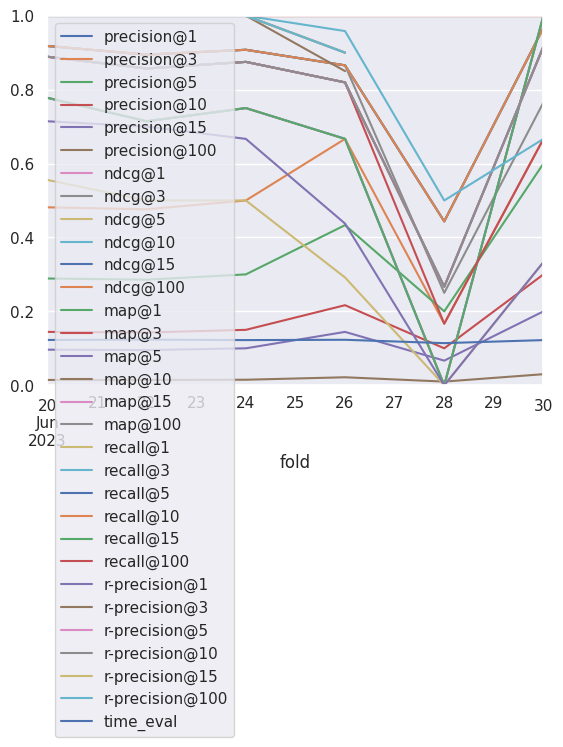

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        1.000000
precision@3        0.576279
precision@5        0.351323
precision@10       0.175661
precision@15       0.117108
precision@100      0.017566
ndcg@1             1.000000
ndcg@3             1.000000
ndcg@5             1.000000
ndcg@10            1.000000
ndcg@15            1.000000
ndcg@100           1.000000
map@1              1.000000
map@3              1.000000
map@5              1.000000
map@10             1.000000
map@15             1.000000
map@100            1.000000
recall@1           0.698082
recall@3           0.993056
recall@5           1.000000
recall@10          1.000000
recall@15          1.000000
recall@100         1.000000
r-precision@1      0.698082
r-precision@3      0.993056
r-precision@5      1.000000
r-precision@10     1.000000
r-precision@15     1.000000
r-precision@100    1.000000
time_eval          0.127259
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-20,1.0,0.481481,0.288889,0.144444,0.096296,0.014444,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.777778,1.000000,1.0,1.0,1.0,1.0,0.128691
2023-06-22,1.0,0.476190,0.285714,0.142857,0.095238,0.014286,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.785714,1.000000,1.0,1.0,1.0,1.0,0.128841
2023-06-24,1.0,0.500000,0.300000,0.150000,0.100000,0.015000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.750000,1.000000,1.0,1.0,1.0,1.0,0.128345
2023-06-26,1.0,0.666667,0.433333,0.216667,0.144444,0.021667,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.541667,0.958333,1.0,1.0,1.0,1.0,0.129327
2023-06-28,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,0.122638
2023-06-30,1.0,1.000000,0.600000,0.300000,0.200000,0.030000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.333333,1.000000,1.0,1.0,1.0,1.0,0.125714


(0.0, 1.0)

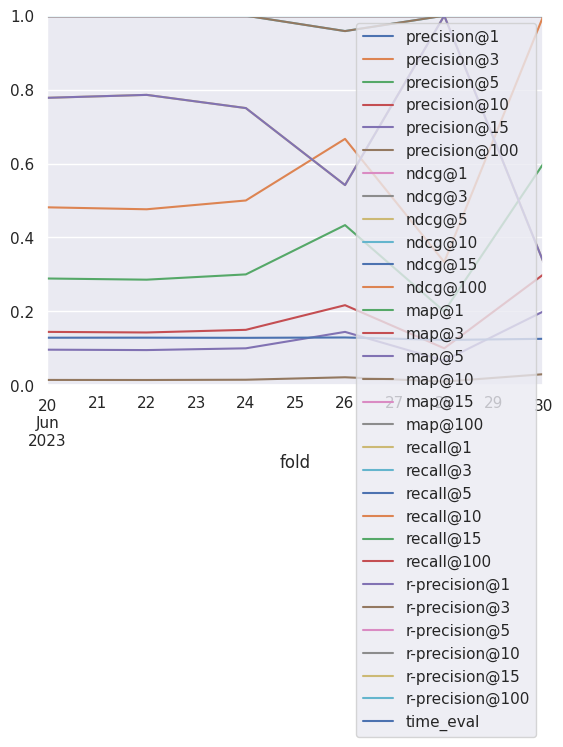

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,239,55,0.434688,0.434688,9.119218e-08,0.000000,0.000000,0.000000,0.000000,0.222222,...,1.894755,11,10,2,1,0.0033,1.225140e-07,10YE,2021-11-03T00:00:00,09dac4fa
1,203,5,0.553048,0.553048,2.355446e-07,0.003367,0.111111,0.111111,0.111111,0.111111,...,0.346845,1,9,7,3,0.0163,3.330857e-07,30d,2021-11-03T00:00:00,0203c739
2,202,20,0.664201,0.663688,5.124423e-04,0.314815,0.444444,0.444444,0.444444,0.444444,...,0.813927,4,10,1,1,0.0036,4.446346e-03,21d,2021-11-03T00:00:00,b70bb0c7
3,64,180,4.653120,4.583502,6.961842e-02,0.111111,0.111111,0.111111,0.111111,0.222222,...,6.232751,36,6,217,2,0.4785,2.539909e-06,21d,2021-11-03T00:00:00,108ebb00
4,203,190,0.085932,0.085930,1.351087e-06,0.166667,0.222222,0.222222,0.222222,0.333333,...,6.235785,38,10,3,3,0.0059,2.279396e-07,60d,2021-11-03T00:00:00,0deaa891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,512,40,0.604120,0.603681,4.386147e-04,0.250000,0.300000,0.300000,0.300000,0.400000,...,1.677949,8,9,13,3,0.0008,1.309396e-03,90d,2021-11-13T00:00:00,4f841f42
96,512,110,0.456541,0.456509,3.266935e-05,0.750000,0.800000,0.800000,0.800000,1.000000,...,4.076077,22,9,82,4,0.0002,2.433089e-05,30d,2021-11-13T00:00:00,65934fc9
97,64,85,0.422583,0.422576,7.695762e-06,0.550000,0.600000,0.600000,0.600000,1.000000,...,5.388672,17,6,36,4,0.0001,5.982318e-06,60d,2021-11-13T00:00:00,b26f4c5f
98,631,35,0.371279,0.369659,1.619359e-03,0.650000,0.700000,0.700000,0.700000,0.900000,...,1.407105,7,10,61,4,0.0010,9.336380e-04,30d,2021-11-13T00:00:00,637f846e


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2021-11-03 1024       2             1           0.0033        1.225140e-07 10YE                 5   
                                                                           10YE                10   
                                                                           10YE                15   
                                                                           10YE                20   
                                                                           10YE                25   
...                                                                                           ...   
2021-11-13 256        127           4           0.0002        2.796868e-06 10YE               180   
                                                                           10YE               185   
                                                                           10YE               190   
                                                                           10YE               195   
                                                                           10YE               200   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-03 1024       2             1           0.0033        1.225140e-07 10YE         0.686045   
                                                                           10YE         0.679967   
                                                                           10YE         0.666792   
                                                                           10YE         0.653305   
                                                                           10YE         0.629900   
...                                                                                          ...   
2021-11-13 256        127           4           0.0002        2.796868e-06 10YE         0.082414   
                                                                           10YE         0.080638   
                                                                           10YE         0.075389   
                                                                           10YE         0.075964   
                                                                           10YE         0.069293   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-03 1024       2             1           0.0033        1.225140e-07 10YE         0.686045   
                                                                           10YE         0.679967   
                                                                           10YE         0.666792   
                                                                           10YE         0.653305   
                                                                           10YE         0.629900   
...                                                                                          ...   
2021-11-13 256        127           4           0.0002        2.796868e-06 10YE         0.082397   
                                                                           10YE         0.080620   
                                                                           10YE         0.075371   
                                                                           10YE         0.075946   
                                                                           10YE         0.069274   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/HUWA-DAO/models/lightgcn-all_2d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2021-11-07 256        1             4           0.0112        7.686022e-07 10YE                25   
           1024       19            4           0.0001        1.379206e-04 60d                200   
                      3             3           0.0338        1.557513e-03 10YE               155   
           512        86            2           0.0006        1.343254e-03 21d                 70   
           128        34            2           0.0091        7.608004e-04 60d                200   
...                                                                                           ...   
2021-11-13 64         3             4           0.0004        7.585329e-04 90d                 90   
                      46            4           0.0020        2.419318e-03 30d                  5   
                                                0.0001        2.315763e-04 30d                 75   
           512        82            4           0.0002        2.433089e-05 30d                145   
                      86            3           0.0002        1.667490e-04 30d                 70   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-07 256        1             4           0.0112        7.686022e-07 10YE         0.327673   
           1024       19            4           0.0001        1.379206e-04 60d          0.625074   
                      3             3           0.0338        1.557513e-03 10YE         0.069588   
           512        86            2           0.0006        1.343254e-03 21d          0.249274   
           128        34            2           0.0091        7.608004e-04 60d          0.010934   
...                                                                                          ...   
2021-11-13 64         3             4           0.0004        7.585329e-04 90d          0.353301   
                      46            4           0.0020        2.419318e-03 30d          0.363543   
                                                0.0001        2.315763e-04 30d          0.416599   
           512        82            4           0.0002        2.433089e-05 30d          0.365477   
                      86            3           0.0002        1.667490e-04 30d          0.560748   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2021-11-07 256        1             4           0.0112        7.686022e-07 10YE         0.327671   
           1024       19            4           0.0001        1.379206e-04 60d          0.625029   
                      3             3           0.0338        1.557513e-03 10YE         0.049243   
           512        86            2           0.0006        1.343254e-03 21d          0.245688   
           128        34            2           0.0091        7.608004e-04 60d          0.002307   
...                                                                                          ...   
2021-11-13 64         3             4           0.0004        7.585329e-04 90d          0.352167   
                      46            4           0.0020        2.419318e-03 30d          0.359359   
                                                0.0001        2.315763e-04 30d          0.416281   
           512        82            4           0.0002        2.433089e-05 30d          0.365432   
                      86            3           0.0002        1.667490e-04 30d          0.560596   

                                                                                        emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2        

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/HUWA-DAO/models/lightgcn-best-val_2d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2021-11-03,1024,1,3,0.5152,3.340294e-07,30d,105,0.146099,0.146097,0.000002,0.555556,0.259259,0.200000,0.177778,0.155556,0.048889,0.555556,...,0.648990,0.659091,0.684343,0.709596,0.785354,0.001424,0.426768,2.813016,False,41c592af
2021-11-05,128,143,2,0.0010,3.835069e-05,10YE,20,0.207415,0.207273,0.000142,0.200000,0.200000,0.200000,0.180000,0.133333,0.040000,0.200000,...,0.526316,0.578947,0.684211,0.710526,0.710526,0.001980,0.331240,0.534431,False,da769fb2
2021-11-07,1024,332,3,0.4863,2.211585e-03,10YE,140,3.483970,0.244438,3.239533,0.030864,0.022634,0.023457,0.020370,0.017284,0.005988,0.030864,...,1.000000,0.875000,0.875000,0.875000,0.875000,0.002508,1.028203,10.396214,False,eee83a6e
2021-11-09,64,1,4,0.0578,2.439123e-04,10YE,195,0.240289,0.236385,0.003904,0.769231,0.269231,0.169231,0.092308,0.064103,0.011538,0.769231,...,0.920833,0.920833,0.920833,0.920833,0.920833,0.002317,6.391678,6.414395,False,c5ac1592
2021-11-11,64,4,4,0.0002,5.024138e-03,60d,190,0.342917,0.334564,0.008353,0.800000,0.300000,0.190000,0.105000,0.070000,0.011000,0.800000,...,0.968750,0.968750,0.968750,0.968750,0.968750,0.001873,5.442649,5.860496,False,aa2922cd
2021-11-13,512,86,3,0.0002,1.667490e-04,30d,70,0.560748,0.560596,0.000152,1.000000,0.333333,0.220000,0.110000,0.073333,0.011000,1.000000,...,0.950000,0.950000,0.950000,0.950000,0.950000,0.001425,0.512422,1.937966,False,abde2b1f


,precision@5,map@10
count,6.000000,6.000000
mean,0.167115,0.573243
std,0.072285,0.338255
min,0.023457,0.064461
25%,0.174423,0.372280
50%,0.195000,0.626371
75%,0.200000,0.805099
max,0.220000,0.970000


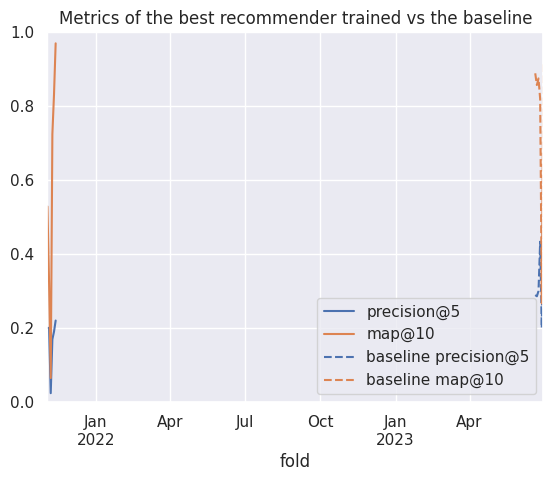

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.167115
ndcg@5          0.586203
precision@10    0.114243
ndcg@10         0.612111
map@5           0.556485
map@10          0.573243
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,239,5,0.686045,0.686045,1.137515e-08,0.111111,0.148148,0.133333,0.111111,0.118519,...,0.136572,False,09dac4fa,1024,2,1,0.0033,1.225140e-07,10YE,2021-11-03
1,239,10,0.679967,0.679967,1.442222e-08,0.111111,0.148148,0.133333,0.122222,0.118519,...,0.273896,False,09dac4fa,1024,2,1,0.0033,1.225140e-07,10YE,2021-11-03
2,239,15,0.666792,0.666792,1.797920e-08,0.111111,0.148148,0.133333,0.133333,0.125926,...,0.410220,False,09dac4fa,1024,2,1,0.0033,1.225140e-07,10YE,2021-11-03
3,239,20,0.653305,0.653305,2.318519e-08,0.111111,0.148148,0.133333,0.133333,0.125926,...,0.544547,False,09dac4fa,1024,2,1,0.0033,1.225140e-07,10YE,2021-11-03
4,239,25,0.629900,0.629900,2.947796e-08,0.000000,0.148148,0.133333,0.133333,0.125926,...,0.675430,False,09dac4fa,1024,2,1,0.0033,1.225140e-07,10YE,2021-11-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,256,180,0.082414,0.082397,1.732072e-05,1.000000,0.333333,0.200000,0.100000,0.066667,...,4.999649,False,053fc9a6,256,127,4,0.0002,2.796868e-06,10YE,2021-11-13
36,256,185,0.080638,0.080620,1.763077e-05,1.000000,0.333333,0.200000,0.100000,0.066667,...,5.138144,False,053fc9a6,256,127,4,0.0002,2.796868e-06,10YE,2021-11-13
37,256,190,0.075389,0.075371,1.810571e-05,1.000000,0.333333,0.200000,0.100000,0.066667,...,5.277813,False,053fc9a6,256,127,4,0.0002,2.796868e-06,10YE,2021-11-13
38,256,195,0.075964,0.075946,1.841826e-05,1.000000,0.333333,0.200000,0.100000,0.066667,...,5.416105,False,053fc9a6,256,127,4,0.0002,2.796868e-06,10YE,2021-11-13


Index intersection: MultiIndex([( 512, 447, 3,                '0.0008', ...),
            ( 256,  27, 2,                '0.2056', ...),
            (1024,   1, 1, '0.0029000000000000002', ...),
            (1024, 364, 2,                '0.0002', ...),
            ( 512,   3, 2,                '0.0001', ...),
            (1024,   1, 3,                '0.0648', ...),
            (  64, 217, 2,   '0.47850000000000004', ...),
            ( 128,  34, 2,                '0.0091', ...),
            ( 512,  26, 2,                '0.6694', ...),
            ( 512,  86, 3,                '0.0002', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 256,  32, 4,  '0.015000000000000001', ...),
            ( 256,  96, 2,                '0.0784', ...),
            ( 128,  97, 4, '0.0021000000000000003', ...),
            ( 512, 665, 3,                '0.0092', ...),
            ( 128,  74, 2,                '0.1736', ...),
            ( 256, 241, 2, '0.0017000000000000001', 

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                    
512               447                  3                  0.0008                0.00012930138476387965 60d                2021-11-05               423   
                                                                                                                          2021-11-05               423   
                                                                                                                          2021-11-05               423   
                                                                                                                          2021-11-05               423   
                                                                                                                          2021-11-05               423   
...                                                                                                                                                ...   
256               241                  2                  0.0017000000000000001 5.104822069911245e-06  90d                2021-11-13               256   
                                                                                                                          2021-11-13               256   
                                                                                                                          2021-11-13               256   
                                                                                                                          2021-11-13               256   
                                                                                                                          2021-11-13               256   

                                                                                                                                       config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                     
512               447                  3                  0.0008                0.00012930138476387965 60d                2021-11-05                  5   
                                                                                                                          2021-11-05                 10   
                                                                                                                          2021-11-05                 15   
                                                                                                                          2021-11-05                 20   
                                                                                                                          2021-11-05                 25   
...                                                                                                                                                 ...   
256               241                  2                  0.0017000000000000001 5.104822069911245e-06  90d                2021-11-13                180   
                                                                                                                          2021-11-13                185   
                                                                                                                          2021-11-13                190   
                                                                                                                          2021-11-13                195   
                                                                                                                          2021-11-13                200   

                                                                                                                    

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_3817914/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,,,,,,,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_total_train,time_total_test,done,trial_id
config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,,,,,,,,,,,,,,,,,,,,,
1024,1,3,0.0648,1.2607076920993434e-06,30d,2021-11-05,203,145,0.167216,0.167211,5.111377e-06,0.555556,0.259259,0.200000,0.177778,0.148148,...,0.648990,0.659091,0.684343,0.699495,0.785354,0.001219,0.499649,3.901761,False,fd88ac15
128,39,2,0.0001,3.955460352915935e-07,10YE,2021-11-07,128,195,0.408018,0.408017,5.700943e-07,0.200000,0.133333,0.120000,0.120000,0.080000,...,1.000000,0.526316,0.605263,0.605263,0.605263,0.001249,1.993999,5.070281,False,08afcbff
1024,332,3,0.4863,0.0022115851672258576,10YE,2021-11-09,622,140,3.483970,0.244438,3.239533e+00,0.030864,0.022634,0.023457,0.020370,0.017284,...,1.000000,0.875000,0.875000,0.875000,0.875000,0.002508,1.028203,10.396214,False,eee83a6e
128,3,4,0.0002,0.0006088320758771427,10YE,2021-11-11,128,185,0.476948,0.476514,4.346268e-04,0.576923,0.217949,0.153846,0.092308,0.064103,...,0.922222,0.922222,0.922222,0.922222,0.922222,0.001411,3.170391,6.044214,False,e18b64bb
64,4,4,0.0002,0.005024137662224589,60d,2021-11-13,64,175,0.364928,0.357399,7.528607e-03,0.800000,0.300000,0.190000,0.105000,0.070000,...,0.968750,0.968750,0.968750,0.968750,0.968750,0.002772,5.000929,5.386695,False,aa2922cd


In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(64, 4, 4, 0.0002, 0.005024137662224589, 60d, 2021-11-13 00:00:00)          40
(128, 3, 4, 0.0002, 0.0006088320758771427, 10YE, 2021-11-11 00:00:00)       40
(128, 39, 2, 0.0001, 3.955460352915935e-07, 10YE, 2021-11-07 00:00:00)      40
(1024, 1, 3, 0.0648, 1.2607076920993434e-06, 30d, 2021-11-05 00:00:00)      40
(1024, 332, 3, 0.4863, 0.0022115851672258576, 10YE, 2021-11-09 00:00:00)    40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2021-11-05,1024,1,3,0.0648,1.2607076920993434e-06,30d,423,145,0.256186,0.256178,...,0.648990,0.659091,0.684343,0.699495,0.785354,0.001219,0.499649,3.901761,False,fd88ac15
2021-11-07,128,39,2,0.0001,3.955460352915935e-07,10YE,128,195,0.375481,0.375480,...,1.000000,0.526316,0.605263,0.605263,0.605263,0.001249,1.993999,5.070281,False,08afcbff
2021-11-09,1024,332,3,0.4863,0.0022115851672258576,10YE,642,140,3.675815,0.734884,...,1.000000,0.875000,0.875000,0.875000,0.875000,0.002508,1.028203,10.396214,False,eee83a6e
2021-11-11,128,3,4,0.0002,0.0006088320758771427,10YE,128,185,0.475361,0.474917,...,0.922222,0.922222,0.922222,0.922222,0.922222,0.001411,3.170391,6.044214,False,e18b64bb
2021-11-13,64,4,4,0.0002,0.005024137662224589,60d,64,175,0.348334,0.340313,...,0.968750,0.968750,0.968750,0.968750,0.968750,0.002772,5.000929,5.386695,False,aa2922cd


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/HUWA-DAO/models/lightgcn-best-test_2d_normalize.parquet


,precision@5,map@10
count,5.000000,5.000000
mean,0.115052,0.329705
std,0.063494,0.326812
min,0.009877,0.018769
25%,0.115385,0.090317
50%,0.120000,0.210073
75%,0.160000,0.533333
max,0.170000,0.796032


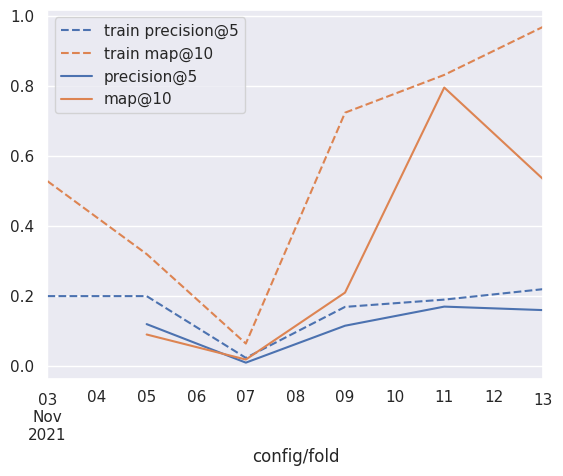

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2021-11-05 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-20,0.777778,0.481481,0.288889,0.144444,0.096296,0.014444,0.777778,0.917984,0.917984,0.917984,...,1.0,1.0,1.0,0.714286,1.000000,1.000000,1.000000,1.000000,1.000000,0.122635
2023-06-22,0.714286,0.476190,0.285714,0.142857,0.095238,0.014286,0.714286,0.894551,0.894551,0.894551,...,1.0,1.0,1.0,0.700000,1.000000,1.000000,1.000000,1.000000,1.000000,0.123530
2023-06-24,0.750000,0.500000,0.300000,0.150000,0.100000,0.015000,0.750000,0.907732,0.907732,0.907732,...,1.0,1.0,1.0,0.666667,1.000000,1.000000,1.000000,1.000000,1.000000,0.122245
2023-06-26,0.666667,0.666667,0.433333,0.216667,0.144444,0.021667,0.666667,0.865571,0.865571,0.865571,...,1.0,1.0,1.0,0.437500,0.850000,0.900000,0.900000,0.900000,0.900000,0.123097
2023-06-28,0.000000,0.166667,0.200000,0.100000,0.066667,0.010000,0.000000,0.250000,0.443426,0.443426,...,1.0,1.0,1.0,0.000000,NaN,NaN,NaN,NaN,NaN,0.114003
2023-06-30,1.000000,0.666667,0.600000,0.300000,0.200000,0.030000,1.000000,0.765361,0.967468,0.967468,...,1.0,1.0,1.0,0.333333,0.666667,0.666667,0.666667,0.666667,0.666667,0.122255


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.35 & 0.18 & 1.00 & 1.00 & 1.00 & 1.00 & 1.00 & 1.00 \\
Leaky GNN & 0.16 & 0.10 & 0.62 & 0.66 & 0.57 & 0.58 & 0.60 & 0.62 \\
GNN & 0.12 & 0.08 & 0.42 & 0.51 & 0.32 & 0.33 & 0.36 & 0.39 \\
OpenPop & 0.35 & 0.18 & 1.00 & 1.00 & 0.77 & 0.77 & 0.83 & 0.83 \\
\end{tabular}



/tmp/ipykernel_3817914/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_3817914/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10           6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             map@5            6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             ndcg@10          6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             ndcg@5           6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             precision@10     6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             precision@5      6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             recall@10        6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             recall@5         6  2023-06-25 00:00:00  2023-06-20 00:00:00   
Leaky GNN    map@10           5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             map@5            5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             ndcg@10          5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             ndcg@5           5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             precision@10     5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             precision@5      5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             recall@10        5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             recall@5         5  2021-11-09 00:00:00  2021-11-05 00:00:00   
GNN          map@10           5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             map@5            5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             ndcg@10          5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             ndcg@5           5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             precision@10     5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             precision@5      5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             recall@10        5  2021-11-09 00:00:00  2021-11-05 00:00:00   
             recall@5         5  2021-11-09 00:00:00  2021-11-05 00:00:00   
OpenPop      map@10           6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             map@5            6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             ndcg@10          6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             ndcg@5           6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             precision@10     6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             precision@5      6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             recall@10        6  2023-06-25 00:00:00  2023-06-20 00:00:00   
             recall@5         6  2023-06-25 00:00:00  2023-06-20 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-22 12:00:00  2023-06-25 00:00:00   
             map@5         2023-06-22 12:00:00  2023-06-25 00:00:00   
             ndcg@10       2023-06-22 12:00:00  2023-06-25 00:00:00   
             ndcg@5        2023-06-22 12:00:00  2023-06-25 00:00:00   
             precision@10  2023-06-22 12:00:00  2023-06-25 00:00:00   
             precision@5   2023-06-22 12:00:00  2023-06-25 00:00:00   
             recall@10     2023-06-22 12:00:00  2023-06-25 00:00:00   
             recall@5      2023-06-22 12:00:00  2023-06-25 00:00:00   
Leaky GNN    map@10        2021-11-07 00:00:00  2021-11-09 00:00:00   
             map@5         2021-11-07 00:00:00  2021-11-09 00:00:00   
             ndcg@10       2021-11-07 00:00:00  2021-11-09 00:00:00   
             ndcg@5        2021-11-07 00:00:00  2021-11-09 00:00:00   
             precision@10  2021-11-07 00:00:00  2021-11-09 00:00:00   
             precision@5   2021-11-07 00:00:00  2021-11-09 00:00:00   
             recall@10     2021-11-07 00:00:00  2021-11-09 00:00:00   
             recall@5      2021-11-07 00:00:00  2021-

/tmp/ipykernel_3817914/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3817914/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10         6.0  1.000000  0.000000  1.000000  1.000000   
             precision@5    6.0  0.351323  0.143039  0.200000  0.286508   
Leaky GNN    map@10         6.0  0.573243  0.338255  0.064461  0.372280   
             precision@5    6.0  0.167115  0.072285  0.023457  0.174423   
GNN          map@10         5.0  0.329705  0.326812  0.018769  0.090317   
             precision@5    5.0  0.115052  0.063494  0.009877  0.115385   
OpenPop      map@10         6.0  0.770635  0.249019  0.266667  0.828869   
             precision@5    6.0  0.351323  0.143039  0.200000  0.286508   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.294444  0.400000  0.600000  
Leaky GNN    map@10       0.626371  0.805099  0.970000  
             precision@5  0.195000  0.200000  0.220000  
GNN          map@10       0.210073  0.533333  0.796032  
             precision@5  0.120000  0.160000  0.170000  
OpenPop      map@10       0.866071  0.885417  0.916667  
             precision@5  0.294444  0.400000  0.600000

Cannot show ipywidgets in text

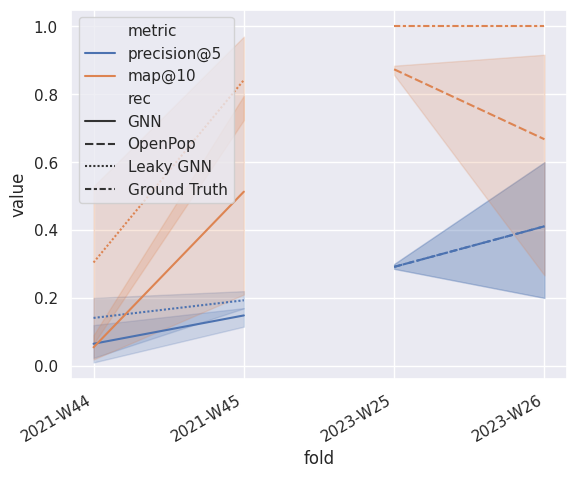

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_3817914/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3817914/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,6.0,0.351323,0.143039,0.200000,0.286508,0.294444,0.40,0.60
GNN,precision@5,5.0,0.115052,0.063494,0.009877,0.115385,0.120000,0.16,0.17
OpenPop,precision@5,6.0,0.351323,0.143039,0.200000,0.286508,0.294444,0.40,0.60


Cannot show ipywidgets in text

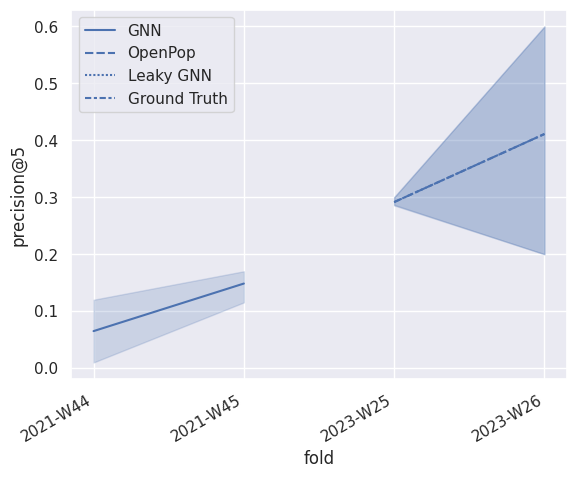

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_3817914/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3817914/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,6.0,0.351323,0.143039,0.200000,0.286508,0.294444,0.40,0.60
Leaky GNN,precision@5,5.0,0.160538,0.078784,0.023457,0.169231,0.190000,0.20,0.22
GNN,precision@5,5.0,0.115052,0.063494,0.009877,0.115385,0.120000,0.16,0.17
OpenPop,precision@5,6.0,0.351323,0.143039,0.200000,0.286508,0.294444,0.40,0.60


Cannot show ipywidgets in text

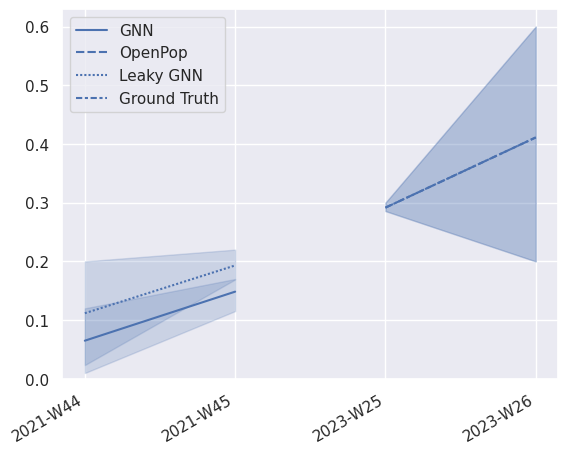

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_3817914/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3817914/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,6.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GNN,map@10,5.0,0.329705,0.326812,0.018769,0.090317,0.210073,0.533333,0.796032
OpenPop,map@10,6.0,0.770635,0.249019,0.266667,0.828869,0.866071,0.885417,0.916667


Cannot show ipywidgets in text

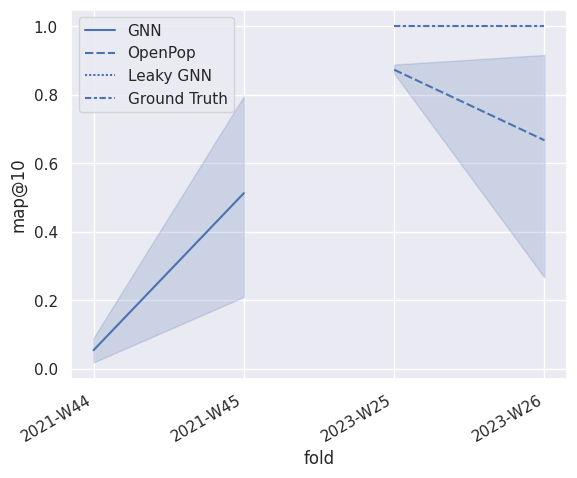

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_3817914/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3817914/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,6.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GNN,ndcg@10,5.0,0.388012,0.317639,0.035719,0.192424,0.292587,0.597450,0.821881
OpenPop,ndcg@10,6.0,0.832789,0.193652,0.443426,0.872816,0.901142,0.915421,0.967468


Cannot show ipywidgets in text

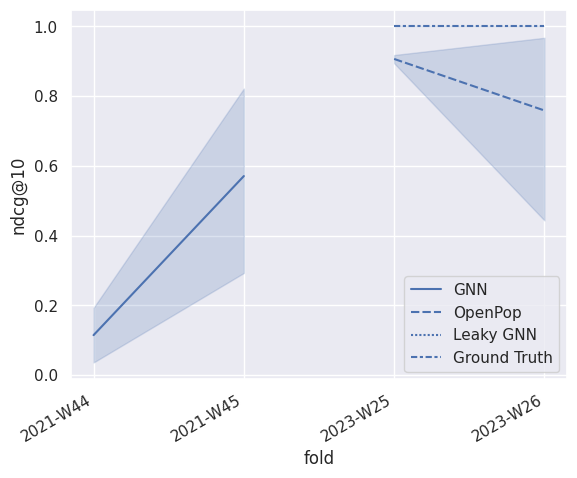

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_3817914/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3817914/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,6.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Leaky GNN,ndcg@10,5.0,0.615934,0.370887,0.093952,0.376800,0.750695,0.873191,0.985034
GNN,ndcg@10,5.0,0.388012,0.317639,0.035719,0.192424,0.292587,0.597450,0.821881
OpenPop,ndcg@10,6.0,0.832789,0.193652,0.443426,0.872816,0.901142,0.915421,0.967468


Cannot show ipywidgets in text

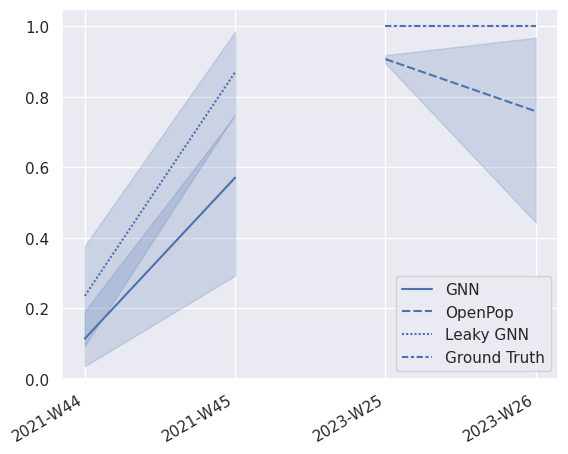

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')